# BiPolar Assignment

## Importing necessary libraries

In [ ]:
import warnings
warnings.filterwarnings("ignore")
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

from torchvision.datasets import ImageFolder
import torchvision.transforms as T
from torchvision.utils import make_grid
from torchvision.utils import save_image
import torchvision.utils as vutils

from IPython.display import Image
import cv2
import random

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
root='//content/drive/MyDrive/Abstract_gallery'
explore = ImageFolder(root)

### Setting random seed value for reproducing

In [ ]:
# Set random seed for reproducibility.
seed = 369
random.seed(seed)
torch.manual_seed(seed)
print("Random Seed: ", seed)

Random Seed:  369


### Visualizing the data

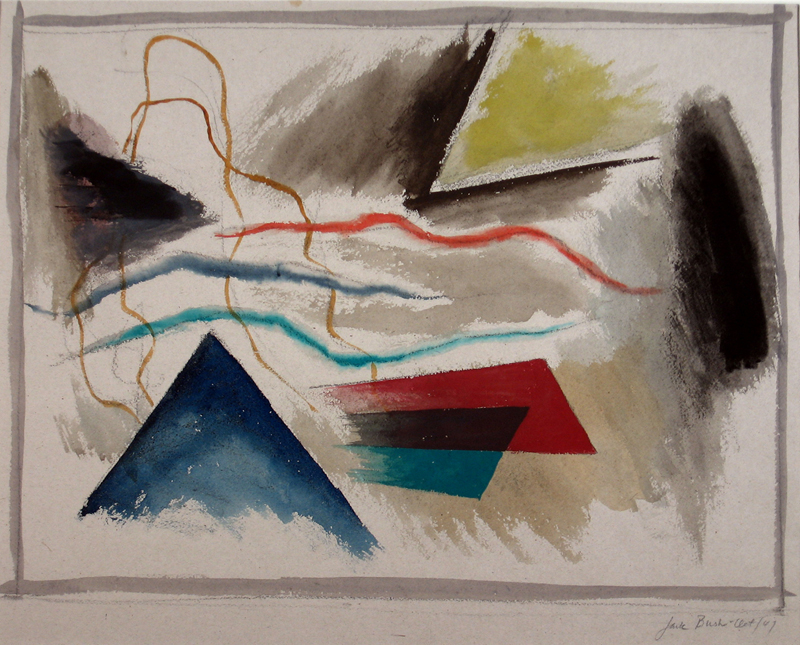

In [ ]:
explore[21][0]

## Defining the Parameters

In [ ]:
params = {
    "bsize" : 128,# Batch size during training.
    'imsize' : 64,# Spatial size of training images. All images will be resized to this size during preprocessing.
    'nc' : 3,# Number of channles in the training images. For coloured images this is 3.
    'nz' : 100,# Size of the Z latent vector (the input to the generator).
    'ngf' : 64,# Size of feature maps in the generator. The depth will be multiples of this.
    'ndf' : 64, # Size of features maps in the discriminator. The depth will be multiples of this.
    'nepochs' : 125,# Number of training epochs.
    'lr' : 0.0002,# Learning rate for optimizers
    'beta1' : 0.5,# Beta1 hyperparam for Adam optimizer
    'save_epoch' : 25}# Save step.

### Creating a function for creating the dataloader object

In [ ]:
def get_dataloader(params):
    
    # Data proprecessing.
    transform = T.Compose([
        T.Resize(params['imsize']),
        T.CenterCrop(params['imsize']),
        T.ToTensor(),
        T.Normalize((0.5, 0.5, 0.5),
            (0.5, 0.5, 0.5))])

    # Create the dataset.
    dataset = ImageFolder(root=root, transform=transform)

    # Create the dataloader.
    dataloader = DataLoader(dataset,
        batch_size=params['bsize'],
        shuffle=True)

    return dataloader

### Setting up device agnostic code

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print('Using device:', device)

Using device: cuda


In [ ]:
dataloader = get_dataloader(params)

### Visualizing a batch

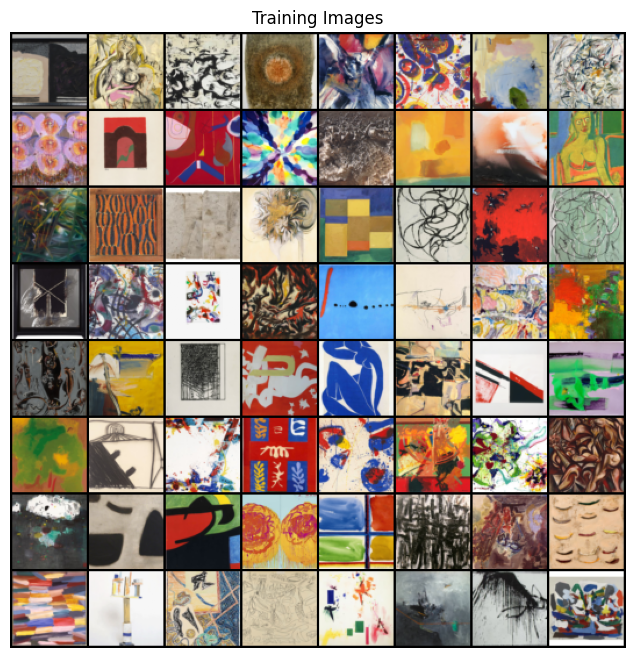

In [ ]:
sample_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(
    sample_batch[0].to(device)[ : 64], padding=2, normalize=True).cpu(), (1, 2, 0)))

plt.show()

## Creating functions and classes for weights initialization, Generator and Discriminator

In [ ]:
def weights_init(w):
    """
    Initializes the weights of the layer, w.
    """
    classname = w.__class__.__name__
    if classname.find('conv') != -1:
        nn.init.normal_(w.weight.data, 0.0, 0.02)
    elif classname.find('bn') != -1:
        nn.init.normal_(w.weight.data, 1.0, 0.02)
        nn.init.constant_(w.bias.data, 0)

# Define the Generator Network
class Generator(nn.Module):
    def __init__(self, params):
        super().__init__()

        # Input is the latent vector Z.
        self.tconv1 = nn.ConvTranspose2d(params['nz'], params['ngf']*8,
            kernel_size=4, stride=1, padding=0, bias=False)
        self.bn1 = nn.BatchNorm2d(params['ngf']*8)

        # Input Dimension: (ngf*8) x 4 x 4
        self.tconv2 = nn.ConvTranspose2d(params['ngf']*8, params['ngf']*4,
            4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(params['ngf']*4)

        # Input Dimension: (ngf*4) x 8 x 8
        self.tconv3 = nn.ConvTranspose2d(params['ngf']*4, params['ngf']*2,
            4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(params['ngf']*2)

        # Input Dimension: (ngf*2) x 16 x 16
        self.tconv4 = nn.ConvTranspose2d(params['ngf']*2, params['ngf'],
            4, 2, 1, bias=False)
        self.bn4 = nn.BatchNorm2d(params['ngf'])

        # Input Dimension: (ngf) * 32 * 32
        self.tconv5 = nn.ConvTranspose2d(params['ngf'], params['nc'],
            4, 2, 1, bias=False)
        #Output Dimension: (nc) x 64 x 64

    def forward(self, x):
        x = F.relu(self.bn1(self.tconv1(x)))
        x = F.relu(self.bn2(self.tconv2(x)))
        x = F.relu(self.bn3(self.tconv3(x)))
        x = F.relu(self.bn4(self.tconv4(x)))

        x = F.tanh(self.tconv5(x))

        return x

# Define the Discriminator Network
class Discriminator(nn.Module):
    def __init__(self, params):
        super().__init__()

        # Input Dimension: (nc) x 64 x 64
        self.conv1 = nn.Conv2d(params['nc'], params['ndf'],
            4, 2, 1, bias=False)

        # Input Dimension: (ndf) x 32 x 32
        self.conv2 = nn.Conv2d(params['ndf'], params['ndf']*2,
            4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(params['ndf']*2)

        # Input Dimension: (ndf*2) x 16 x 16
        self.conv3 = nn.Conv2d(params['ndf']*2, params['ndf']*4,
            4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(params['ndf']*4)

        # Input Dimension: (ndf*4) x 8 x 8
        self.conv4 = nn.Conv2d(params['ndf']*4, params['ndf']*8,
            4, 2, 1, bias=False)
        self.bn4 = nn.BatchNorm2d(params['ndf']*8)

        # Input Dimension: (ndf*8) x 4 x 4
        self.conv5 = nn.Conv2d(params['ndf']*8, 1, 4, 1, 0, bias=False)

    def forward(self, x):
        x = F.leaky_relu(self.conv1(x), 0.2, True)
        x = F.leaky_relu(self.bn2(self.conv2(x)), 0.2, True)
        x = F.leaky_relu(self.bn3(self.conv3(x)), 0.2, True)
        x = F.leaky_relu(self.bn4(self.conv4(x)), 0.2, True)

        x = F.sigmoid(self.conv5(x))

        return x

In [ ]:
# Create the generator.
netG = Generator(params).to(device)
# Apply the weights_init() function to randomly initialize all
# weights to mean=0.0, stddev=0.2
netG.apply(weights_init)
# Print the model.
print(netG)

# Create the discriminator.
netD = Discriminator(params).to(device)
# Apply the weights_init() function to randomly initialize all
# weights to mean=0.0, stddev=0.2
netD.apply(weights_init)
# Print the model.
print(netD)

Generator(
  (tconv1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv2): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv4): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv5): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
)
Discriminator(
  (conv1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv2): Conv2d(64, 128, kernel_size=(

### Setting up the loss finction and the optimizer

In [ ]:
# Binary Cross Entropy loss function.
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, params['nz'], 1, 1, device=device)

real_label = 1
fake_label = 0

# Optimizer for the discriminator.
optimizerD = torch.optim.Adam(netD.parameters(), lr=params['lr'], betas=(params['beta1'], 0.999))
# Optimizer for the generator.
optimizerG = torch.optim.Adam(netG.parameters(), lr=params['lr'], betas=(params['beta1'], 0.999))

In [ ]:
# Stores generated images as training progresses.
img_list = []
# Stores generator losses during training.
G_losses = []
# Stores discriminator losses during training.
D_losses = []

**Creating Model directory to save weights(checkpoints) for various epochs**

In [ ]:
!mkdir model

## Training

In [ ]:
iters = 0

print("Starting Training Loop...")
print("-"*25)

for epoch in range(params['nepochs']):
    for i, data in enumerate(dataloader, 0):
        # Transfer data tensor to GPU/CPU (device)
        real_data = data[0].to(device)
        # Get batch size. Can be different from params['nbsize'] for last batch in epoch.
        b_size = real_data.size(0)
        
        # Make accumalated gradients of the discriminator zero.
        netD.zero_grad()
        # Create labels for the real data. (label=1)
        label = torch.full((b_size, ), real_label, device=device).float()
        output = netD(real_data).view(-1)
        errD_real = criterion(output, label)
        # Calculate gradients for backpropagation.
        errD_real.backward()
        D_x = output.mean().item()
        
        # Sample random data from a unit normal distribution.
        noise = torch.randn(b_size, params['nz'], 1, 1, device=device)
        # Generate fake data (images).
        fake_data = netG(noise)
        # Create labels for fake data. (label=0)
        label.fill_(fake_label  )

        output = netD(fake_data.detach()).view(-1)
        errD_fake = criterion(output, label)
        # Calculate gradients for backpropagation.
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Net discriminator loss.
        errD = errD_real + errD_fake
        # Update discriminator parameters.
        optimizerD.step()
        
        # Make accumalted gradients of the generator zero.
        netG.zero_grad()
        # We want the fake data to be classified as real. Hence
        # real_label are used. (label=1)
        label.fill_(real_label)
        # No detach() is used here as we want to calculate the gradients w.r.t.
        # the generator this time.
        output = netD(fake_data).view(-1)
        errG = criterion(output, label)

        errG.backward()

        D_G_z2 = output.mean().item()
        # Update generator parameters.
        optimizerG.step()

        # Check progress of training.
        if i%50 == 0:
            print(torch.cuda.is_available())
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, params['nepochs'], i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save the losses for plotting.
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on a fixed noise.
        if (iters % 100 == 0) or ((epoch == params['nepochs']-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake_data = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake_data, padding=2, normalize=True))

        iters += 1

    # Save the model.
    if epoch % params['save_epoch'] == 0:
        torch.save({
            'generator' : netG.state_dict(),
            'discriminator' : netD.state_dict(),
            'optimizerG' : optimizerG.state_dict(),
            'optimizerD' : optimizerD.state_dict(),
            'params' : params
            }, 'model/model_epoch_{}.pth'.format(epoch))


Starting Training Loop...
-------------------------
True
[0/125][0/22]	Loss_D: 1.4286	Loss_G: 3.9650	D(x): 0.6271	D(G(z)): 0.6073 / 0.0202
True
[1/125][0/22]	Loss_D: 0.0633	Loss_G: 4.6937	D(x): 0.9572	D(G(z)): 0.0185 / 0.0101
True
[2/125][0/22]	Loss_D: 0.3182	Loss_G: 12.9373	D(x): 0.7796	D(G(z)): 0.0001 / 0.0000
True
[3/125][0/22]	Loss_D: 0.7036	Loss_G: 5.6550	D(x): 0.7561	D(G(z)): 0.2798 / 0.0050
True
[4/125][0/22]	Loss_D: 0.5082	Loss_G: 3.6749	D(x): 0.7783	D(G(z)): 0.2079 / 0.0307
True
[5/125][0/22]	Loss_D: 0.2299	Loss_G: 3.9667	D(x): 0.8818	D(G(z)): 0.0936 / 0.0210
True
[6/125][0/22]	Loss_D: 0.1216	Loss_G: 3.9041	D(x): 0.9228	D(G(z)): 0.0355 / 0.0224
True
[7/125][0/22]	Loss_D: 0.1501	Loss_G: 4.3037	D(x): 0.8943	D(G(z)): 0.0191 / 0.0354
True
[8/125][0/22]	Loss_D: 0.7703	Loss_G: 3.8665	D(x): 0.5600	D(G(z)): 0.0248 / 0.0418
True
[9/125][0/22]	Loss_D: 1.3520	Loss_G: 5.7689	D(x): 0.9624	D(G(z)): 0.6894 / 0.0045
True
[10/125][0/22]	Loss_D: 0.3623	Loss_G: 3.7066	D(x): 0.8950	D(G(z)): 0.210

## Saving the final model

In [ ]:
torch.save({
            'generator' : netG.state_dict(),
            'discriminator' : netD.state_dict(),
            'optimizerG' : optimizerG.state_dict(),
            'optimizerD' : optimizerD.state_dict(),
            'params' : params
            }, 'model/model_final.pth')

### Visualizing the loss for the generator and the discriminator

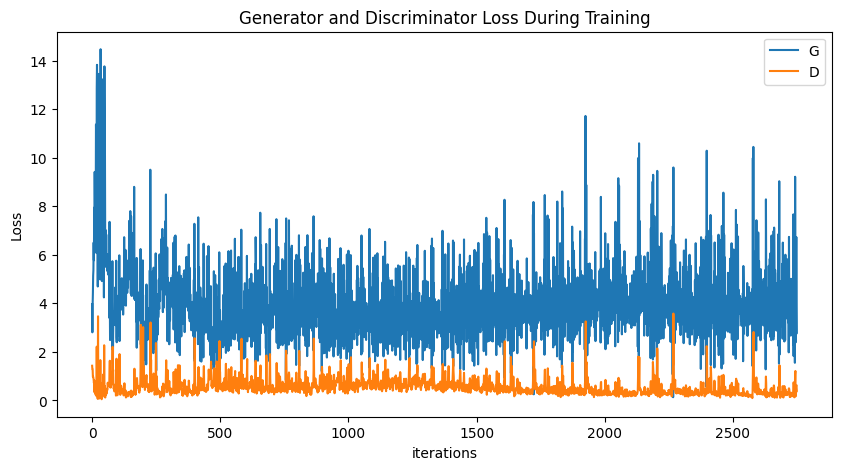

In [ ]:
# Plot the training losses.
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

### Saving the animation for training progress

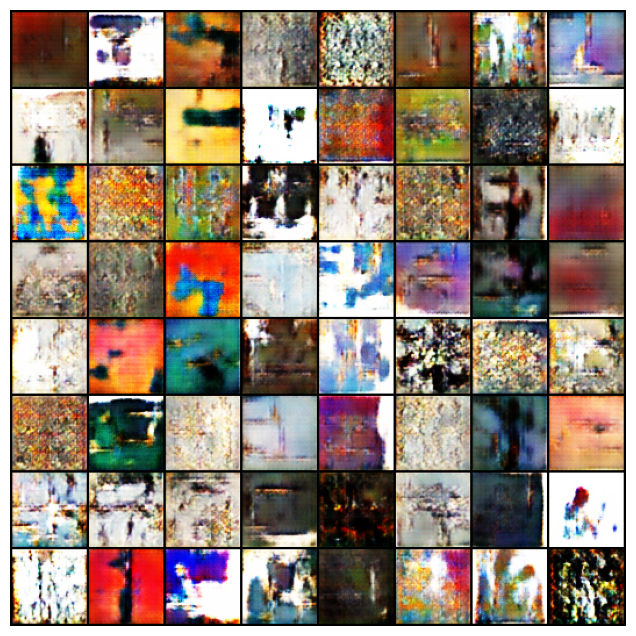

In [ ]:
import matplotlib.animation as animation

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
anim = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
# plt.show()
anim.save('art.gif', dpi=80, writer='imagemagick')

### Performing Inference

Generator(
  (tconv1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv2): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv4): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv5): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
)
64


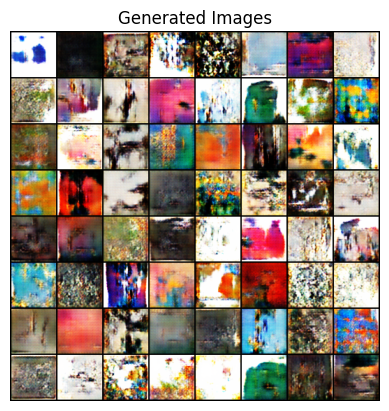

In [ ]:
state_dict = torch.load("/content/model/model_final.pth")
# Set the device to run on: GPU or CPU.
device = torch.device("cuda:0" if(torch.cuda.is_available()) else "cpu")
# Get the 'params' dictionary from the loaded state_dict.
params = state_dict['params']

# Create the generator network.
netG = Generator(params).to(device)
# Load the trained generator weights.
netG.load_state_dict(state_dict['generator'])
print(netG)
# Get latent vector Z from unit normal distribution.
noise = torch.randn(64, params['nz'], 1, 1, device=device)

# Turn off gradient calculation to speed up the process.
with torch.no_grad():
	# Get generated image from the noise vector using
	# the trained generator.
    generated_img = netG(noise).detach().cpu()

# Display the generated image.
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(vutils.make_grid(generated_img, padding=2, normalize=True), (1,2,0)))

plt.show()

### Final Results of the training progress

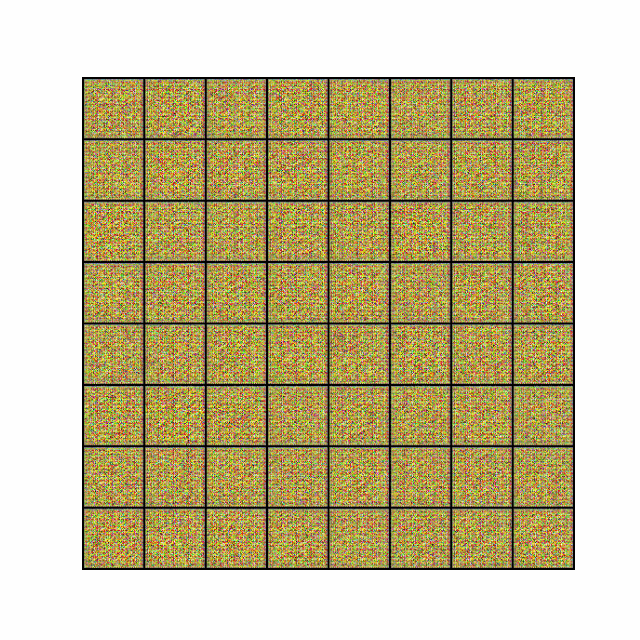

### Importing libraries for calculating the Frechet Distance

In [ ]:
from scipy import linalg
from torch.nn.functional import adaptive_avg_pool2d
import torchvision.models as models

### Defining the InceptionV3 Model and different functions to calculate the FID score



In [ ]:
class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=[DEFAULT_BLOCK_INDEX],
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False):
        
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()

        
        inception = models.inception_v3(pretrained=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp
    
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
model = InceptionV3([block_idx])
model=model.cuda()

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


  0%|          | 0.00/104M [00:00<?, ?B/s]

In [ ]:
def calculate_activation_statistics(images,model,batch_size=128, dims=2048,
                    cuda=False):
    model.eval()
    act=np.empty((len(images), dims))
    
    if cuda:
        batch=images.cuda()
    else:
        batch=images
    pred = model(batch)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
    if pred.size(2) != 1 or pred.size(3) != 1:
        pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

    act= pred.cpu().data.numpy().reshape(pred.size(0), -1)
    
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma

In [ ]:
def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)

In [ ]:
def calculate_fretchet(images_real,images_fake,model):
     mu_1,std_1=calculate_activation_statistics(images_real,model,cuda=True)
     mu_2,std_2=calculate_activation_statistics(images_fake,model,cuda=True)
    
     """get fretched distance"""
     fid_value = calculate_frechet_distance(mu_1, std_1, mu_2, std_2)
     return fid_value

In [ ]:
i,data = next(enumerate(dataloader,0))

Final FID score over a batch

In [ ]:
real = data[0].to(device)
fake = netG(noise)
fretchet_dist=calculate_fretchet(real,fake,model)
print(f'Fretchet Distance: {fretchet_dist}')

Fretchet Distance: 235.51657948179286


## How to deploy the trained GAN to AWS to enable real-time image generation through an API.

To deploy a trained GAN on AWS for real-time image generation through an API, you can follow these general steps:

*   **Create an EC2 instance with GPU support**: You will need an EC2 instance that has a GPU to run the deep learning model. You can launch an EC2 instance with GPU support using the AWS Management Console.

*   **Install necessary software and dependencies**: Once the EC2 instance is launched, you will need to install the necessary software and dependencies for your GAN model. This may include installing PyTorch, torchvision, and other dependencies required by your model.

*   **Upload the model and inference code to EFS**: Upload the .pth file for the GAN model and the inference code to Amazon Elastic File System (EFS), which is a scalable file storage system that can be mounted to an EC2 instance.

*   **Mount EFS to the EC2 instance**: You will need to mount the EFS file system to the EC2 instance to access the model and inference code.

*   **Deploy the inference code as a Lambda function**: Create a Lambda function using the AWS Management Console and deploy the inference code as the function code.

*   **Create an API Gateway**: Create an API Gateway using the AWS Management Console to enable real-time image generation through an API.

*   **Connect the Lambda function to the API Gateway**: Connect the Lambda function to the API Gateway to enable the API to invoke the Lambda function and generate images in real-time.

*   **Test the API**: Test the API using a REST client or other tool to ensure that it is generating images as expected.







